# このノートブック・ライセンスについて

 - Google のドキュメントに掲載されているデモをコピー改変しています。
 - ライセンスは元のコードを引き継ぎ、元のライセンス及びコメントをそのまま掲載しております。Sungmin Han氏に感謝を
 - This project is a modified copy of a demo originally featured in Google's documentation.
 - The license inherits from the original code; the original license and comments are preserved as-is.
 - Special thanks to Sungmin Han for his contributions.

 ---



このノートブック(Google_VertexAI_Imagen_DIY_002.ipynb)を開く
[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/catnipglitch/google-colab-notebooks-catnip/blob/main/google/Google_VertexAI_Imagen_DIY_002.ipynb)


 (オリジナル）のノートブックDo It Yourself Imagen 3 - Vertex AI はこちら。 [![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/drive/1TSNDfzGCbH2ymaSmwhokvyFVtkno3jOv?hl=ja)



オリジナルサンプルコードはノートブック下部に残しています。

### License

This project is licensed under the [Apache 2.0 License](https://www.apache.org/licenses/LICENSE-2.0), and you may edit it without mentioning the source or authors. We encourage you to use it widely for educational and practice purposes.

### Author

This item can be omitted when editing

Sungmin Han (ML GDE) - sniper45han@gmail.com

### License(JP) ライセンス

このプロジェクトは [Apache 2.0 License](https://www.apache.org/licenses/LICENSE-2.0) の下でライセンスされており、ソースや著者を明記せずに編集することができます。教育目的や実践目的での幅広い利用を推奨します。

### 著者

編集時にはこの項目は省略可能です

Sungmin Han (ML GDE) - sniper45han@gmail.com

# インストール

Imagen 3 は Google Cloud Platform（GCP）の Vertex AI SDK を通じて利用できます。  
Vertex AI を使用するには、`google-cloud-aiplatform` パッケージをインストールする必要があります。

- Vertex AI 上の Imagen 3 の詳細: [Link](https://console.cloud.google.com/vertex-ai/publishers/google/model-garden/imagen-3.0-generate-001?project=gde-project-aicloud)


In [ ]:
! pip install --quiet --upgrade --user google-cloud-aiplatform

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.7/7.7 MB 24.7 MB/s eta 0:00:00
  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.


## 準備

- このColabでは、Google Cloud Platform（GCP）アカウントへのアクセスが必要です。
   - GCPアカウントをお持ちでない場合は、アカウントを作成してください。
   - Google Cloud Platform（GCP）リンク: https://cloud.google.com/
- GCPアカウントをお持ちの場合は、ご自身の `PROJECT_ID` を控えておいてください。
   - 詳細はこちら: https://support.google.com/googleapi/answer/7014113

### Colab シークレットの設定
- このサンプルでは下記をシークレットから読み取るように実装しています。事前に設定してください。
 - GCP_PROJECT_ID : Project ID
 - GCP_SA_KEY : サービスアカウントキー

---

 - サービスアカウントキーにはvertexaiのユーザー権限が必要です。
 - サービスアカウントキーは管理画面よりダウンロードしたJsonファイルの中身をコピーして値に張り付けてください。

In [ ]:
import sys

if "google.colab" in sys.modules:
    from google.colab import auth

    auth.authenticate_user()

In [ ]:
# A notebook's kernel restart may be required to ensure package installation.
# パッケージのインストールを確実に反映させるために、ノートブックのカーネルを再起動する必要がある場合があります。

# import IPython

# app = IPython.Application.instance()
# app.kernel.do_shutdown(True)

In [ ]:
#@markdown **利用したいGoogle Cloud Platformのリージョンをドロップダウンリストから選択してください**
# *   **asia-northeast1 (東京)**
# *   **asia-northeast2 (大阪)**
# *   **us-central1 (アイオワ)**
# *   その他、Imagen 3が利用可能なリージョン

from google.colab import userdata

LOCATION = "us-central1"  # @param ["asia-northeast1", "asia-northeast2", "us-central1"] {type:"string"}
PROJECT_ID = userdata.get('GCP_PROJECT_ID')


## Google Cloud Platform への認証

Google Colab を使用する場合、`google.colab.auth` の `authenticate_user()` 関数を使って、Google アカウントの権限をリンクすることができます。以下のコードでその手順を実行できます。  
この方法は、Google Cloud Platform からサービスアカウントの認証情報を取得するよりも便利です。


In [ ]:
# サービス認証 (サービスアカウントキーを使用する場合)
# 注意: セキュリティのため、サービスアカウントキーのJSONの内容は
# Colab のシークレットマネージャに保存することを強く推奨します。

import os
import json
from google.oauth2 import service_account
from google.cloud import storage
from google.colab import userdata
import sys
import vertexai
from vertexai.preview.vision_models import ImageGenerationModel ,GeneratedImage

# --- サービスアカウントキーのJSONの内容をシークレットマネージャから取得 ---
# シークレットマネージャに保存したキーの名前を指定してください
try:
    sa_key_info_str = userdata.get('GCP_SA_KEY')
    if not sa_key_info_str:
         # シークレットがない場合はユーザー認証を促すなど、代替処理を検討
        print("注意: GCP_SA_KEY がシークレットマネージャに設定されていません。")
        print("サービスアカウント認証を使用するには、シークレットマネージャにキーのJSONの内容を登録してください。")
        # ここで sys.exit(1) するか、ユーザー認証にフォールバックするかなどを検討
        # sys.exit(1) # 例として処理を終了する場合
        sa_key_info = None # シークレットがない場合はNoneとする
    else:
        sa_key_info = json.loads(sa_key_info_str)
        print("✅ サービスアカウントキー情報をシークレットマネージャから取得しました。")

except Exception as e:
    print(f"❌ シークレットマネージャからのサービスアカウントキー情報取得に失敗しました: {e}")
    sa_key_info = None


# --- 認証オブジェクトの作成 ---
credentials = None
if sa_key_info:
    try:
        credentials = service_account.Credentials.from_service_account_info(
            sa_key_info,
            scopes=["https://www.googleapis.com/auth/cloud-platform"]
        )
        print("✅ サービスアカウント認証オブジェクトを作成しました。")
    except Exception as e:
        print(f"❌ サービスアカウント認証オブジェクトの作成に失敗しました: {e}")
        credentials = None # 失敗した場合はNoneとする

# --- Cloud Storageクライアント作成（認証情報を使用） ---
if credentials:
    try:
        # シークレットに入っているプロジェクトIDを渡す（これは前述の方法で取得済みと仮定）
        # または、サービスアカウントキーの情報から project_id を取得することも可能
        # project_id = sa_key_info.get('project_id')
        # client = storage.Client(credentials=credentials, project=project_id)

        # 前述の `PROJECT_ID = userdata.get('GCP_PROJECT_ID')` を使用する場合
        client = storage.Client(credentials=credentials, project=PROJECT_ID)

        print(f"✅ Cloud Storageクライアントをサービスアカウント認証で作成しました。")

        # バケット一覧を表示（確認用） - クライアント作成が成功した場合のみ実行
        # try:
        #     buckets = list(client.list_buckets())
        #     print("✅ バケット一覧:")
        #     for b in buckets:
        #         print(f"- {b.name}")
        # except Exception as e:
        #      print(f"❌ バケット一覧の取得に失敗しました（権限不足の可能性）: {e}")


    except Exception as e:
        print(f"❌ Cloud Storageクライアントの作成に失敗しました: {e}")
else:
    print("サービスアカウント認証情報が利用できないため、Cloud Storageクライアントは作成されません。")


# Vertex AI 初期化（サービスアカウント認証情報がある場合はそれを使用）
# PROJECT_ID と LOCATION は既に取得済みと仮定

try:
    if credentials:
        vertexai.init(project=PROJECT_ID, location=LOCATION, credentials=credentials)
        print("✅ Vertex AI をサービスアカウント認証で初期化に成功しました。")
    else:
         # サービスアカウント認証情報がない場合は、ユーザー認証に依存します
         # auth.authenticate_user() が実行されている必要があります
        vertexai.init(project=PROJECT_ID, location=LOCATION)
        print("✅ Vertex AI をユーザー認証で初期化に成功しました。")

except Exception as e:
    print(f"❌ Vertex AI の初期化に失敗しました。原因: {e}")
    sys.exit(1)


# 以下、Imagen モデルの読み込みなどのコードを続けます...
# imagen_model = ImageGenerationModel.from_pretrained("imagen-3.0-generate-001")
# fast_imagen_model = ImageGenerationModel.from_pretrained("imagen-3.0-fast-generate-001")

✅ サービスアカウントキー情報をシークレットマネージャから取得しました。
✅ サービスアカウント認証オブジェクトを作成しました。
✅ Cloud Storageクライアントをサービスアカウント認証で作成しました。
✅ Vertex AI をサービスアカウント認証で初期化に成功しました。


### ✅ `imagen-3.0-generate` 系列のモデル機能比較

| 機能                           | `imagen-3.0-generate-001` | `imagen-3.0-generate-002` | `imagen-3.0-fast-generate-001` |
|--------------------------------|---------------------------|---------------------------|-------------------------------|
| プロンプト強化（enhance_prompt） | ❌ 未対応                  | ✅ 対応                    | ✅ 対応                        |
| ネガティブプロンプト             | ✅ 対応                    | ❌ 未対応                  | ❌ 未対応                      |
| 多言語プロンプト対応             | ❌ 未対応                    | ✅ 対応                    | ✅ 対応                        |
| 高度な画像編集機能              | ❌ 未対応                  | ✅ 対応                    | ❌ 未対応                      |
| 出力速度                        | 標準                      | 標準                      | ✅ 高速                        |
| 出力品質                        | ✅ 高品質                  | ✅ 高品質                  | ⚠️ やや低品質（コスト・速度重視） |

---
## プロンプト強化機能（Prompt Enhancement）の有無
これは、短いプロンプト（30語未満）をより詳細で高品質なプロンプトに自動的に書き換える機能で、生成される画像の品質向上に寄与します。




# Imagen 各モデル仕様
## [imagen-3.0-generate-002 の機能](https://cloud.google.com/vertex-ai/generative-ai/docs/models/imagen/3-0-generate-002?hl=ja%7D)



### 📌 Imagen 3.0 API パラメータ一覧

| パラメータ名            | 型     | 必須 | デフォルト値              | 説明 |
|-------------------------|--------|------|---------------------------|------|
| `prompt`                | string | ✅   | ―                         | 生成する画像のテキストプロンプト。 |
| `number_of_images`      | int    | ✅   | 1                         | 生成する画像の数。 |
| `seed`                  | int    | ❌   | ―                         | 乱数シード。`addWatermark` が `true` の場合は使用不可。`enhancePrompt=true` の場合も無効。 |
| `negative_prompt`       | string | ❌   | ―                         | 含めたくない内容を指定。※`imagen-3.0-generate-002` 以降では非対応。 |
| `aspect_ratio`          | string | ❌   | "1:1"                     | 生成画像のアスペクト比。 |
| `output_mime_type`      | string | ❌   | "image/png"               | 出力画像形式。`"image/png"` または `"image/jpeg"`。 |
| `compression_quality`   | int    | ❌   | 75                        | `"image/jpeg"` 使用時の圧縮品質（0〜100）。 |
| `language`              | string | ❌   | "auto"                    | プロンプトの言語。 `"auto"`, `"en"`, `"zh"`, `"zh-TW"`, `"hi"`, `"ja"`, `"ko"`, `"pt"`, `"es"` から選択。 |
| `output_gcs_uri`        | string | ❌   | ―                         | GCS URI を指定すると、画像をCloud Storageに保存。 |
| `add_watermark`         | bool   | ❌   | true                      | 透かしを追加。`imagegeneration@002` や `@005` では無効。 |
| `safety_filter_level`   | string | ❌   | "block_medium_and_above" | フィルタリングレベル。 `"block_low_and_above"`, `"block_medium_and_above"`, `"block_only_high"`, `"block_none"` から選択。 |
| `person_generation`     | string | ❌   | "allow_adult"             | 人物画像の生成許可設定。 `"dont_allow"`, `"allow_adult"`, `"allow_all"` から選択。 |


# カスタム画像生成コード

In [ ]:
# @title デフォルトのタイトル テキスト {"vertical-output":true}
Imagen_API_Model_List = "imagen-3.0-generate-002" # @param ["imagen-3.0-generate-001","imagen-3.0-generate-002","imagen-3.0-fast-generate-001","imagen-4-0-generate-preview-05-20","imagen-4.0-ultra-generate-exp-05-20"]
Imagen_Fast_API_Model_List = "imagen-3.0-fast-generate-001" # @param ["imagen-3.0-generate-001","imagen-3.0-generate-002","imagen-3.0-fast-generate-001","imagen-4-0-generate-preview-05-20","imagen-4.0-ultra-generate-exp-05-20"]

# --- リージョン指定（手動設定 or UIから選択） ---
print(f"🌎 利用リージョン: {LOCATION}")

# --- Vertex AI の初期化 ---
try:
    vertexai.init(project=PROJECT_ID, location=LOCATION)
    print("✅ Vertex AI の初期化に成功しました。")
except Exception as e:
    print(f"❌ Vertex AI の初期化に失敗しました。原因: {e}")
    sys.exit(1)

# --- Imagen モデルの読み込み --
imagen_model = None  # 続行可能なようにNoneで処理
fast_imagen_model = None

try:
    print(f"📦 {Imagen_API_Model_List} モデルをロード中...")
    imagen_model = ImageGenerationModel.from_pretrained(Imagen_API_Model_List)
    print(f"✅{Imagen_API_Model_List}  の読み込みに成功しました。")
except Exception as e:
    print(f"❌ {Imagen_API_Model_List}  モデルの読み込みに失敗しました。原因: {e}")

try:
    print(f"📦 {Imagen_Fast_API_Model_List} モデルをロード中...")
    fast_imagen_model = ImageGenerationModel.from_pretrained(Imagen_Fast_API_Model_List)
    print(f"✅ {Imagen_Fast_API_Model_List} の読み込みに成功しました。")
except Exception as e:
    print(f"❌ {Imagen_Fast_API_Model_List} モデルの読み込みに失敗しました。原因: {e}")



In [ ]:
%%time
# @title Imagen 画像生成パラメータ設定
image_prompt_01 = "Three cute cats, a black and white tuxedo cat with emerald eyes, a calico cat with a splash of orange and white, and a fluffy, grey Persian with beautiful eyes, are relaxing and playing in a sprawling park on a bright, sunny day. The cats are captured in a broad angle composition to capture the sprawling park environment and to showcase their playful interactions with each other. The image showcases a variety of natural elements like vibrant green grass, colorful flower patches, and majestic old trees, creating a lush and vibrant background for the cats. The image has a vintage, slightly nostalgic aesthetic, achieved with a Kodak Portra film simulation, giving the colors a warm and soft look. The depth of field is shallow, with the focus on the cute cats and their surroundings, while the background is gently blurred, isolating and emphasizing them in the park setting." # @param {type:"string"}
image_prompt_01_lang = "en" # @param ["auto", "en", "zh", "zh-CN", "zh-TW", "hi",  "ja", "ko", "pt", "es"] {type:"string"}
number_of_images_01 = 1 # @param {type:"integer"} min:1, max:4
seed_01 = 0 # @param {type:"integer"}
negative_prompt_01 = "" # @param {type:"string"}
aspect_ratio_01 = "1:1" # @param ["1:1", "9:16", "16:9", "3:4", "4:3"] {type:"string"}

output_mime_type_01 = "image/png" # @param ["image/png", "image/jpeg"] {type:"string"}
compression_quality_01 = 75 # @param {type:"integer"} min:0, max:100
add_watermark_01 = False # @param {type:"boolean"}
safety_filter_level_01 = "block_medium_and_above" # @param ["block_low_and_above", "block_medium_and_above", "block_only_high", "block_none"] {type:"string"}
person_generation_01 = "allow_all" # @param ["dont_allow", "allow_adult", "allow_all"] {type:"string"}

# Red neon sign jellyfish photography

# generate_images の引数にフォームで設定したパラメータを追加
# negative_prompt は一部モデルではサポートされていません
response = imagen_model.generate_images(
    prompt=image_prompt_01,
    language=image_prompt_01_lang,
    number_of_images=number_of_images_01,
    seed=seed_01 if seed_01 > 0 else None, # seedが0の場合はデフォルトNoneを渡すか、指定しない
    # negative_prompt=negative_prompt_01, # モデルによってはサポートされない
    aspect_ratio=aspect_ratio_01,
#    output_mime_type=output_mime_type_01,
 #   compression_quality=compression_quality_01,
    add_watermark=add_watermark_01,
    safety_filter_level=safety_filter_level_01,
    person_generation=person_generation_01
)

# 生成された画像の数だけ表示を繰り返す
for i, img in enumerate(response.images):
    print(f"--- Image {i+1} ---")
    img.show()

Output hidden; open in https://colab.research.google.com to view.

--- Image 1 ---


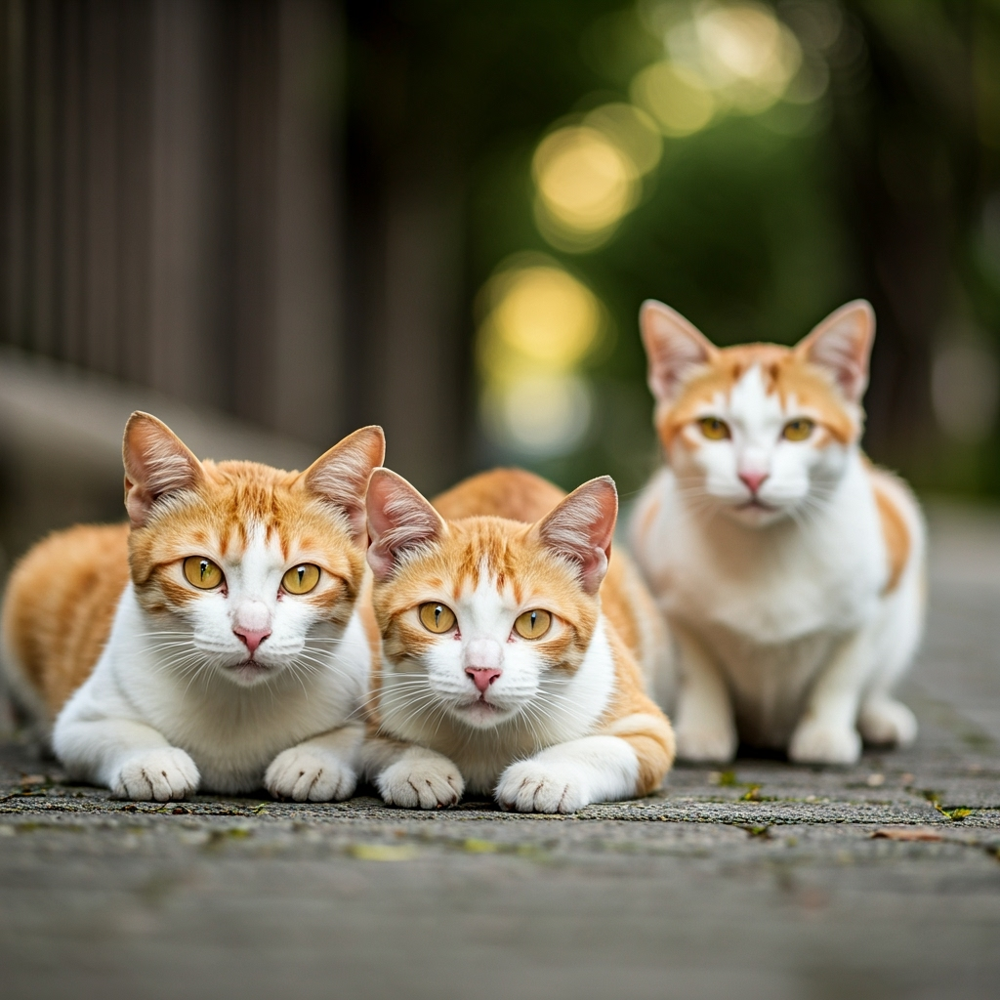

CPU times: user 245 ms, sys: 8.72 ms, total: 254 ms
Wall time: 4.44 s


In [ ]:
%%time
# @title Imagen Fast 画像生成パラメータ設定
image_prompt_01 = "Three cute cats, a black and white tuxedo cat with emerald eyes, a calico cat with a splash of orange and white, and a fluffy, grey Persian with beautiful eyes, are relaxing and playing in a sprawling park on a bright, sunny day. The cats are captured in a broad angle composition to capture the sprawling park environment and to showcase their playful interactions with each other. The image showcases a variety of natural elements like vibrant green grass, colorful flower patches, and majestic old trees, creating a lush and vibrant background for the cats. The image has a vintage, slightly nostalgic aesthetic, achieved with a Kodak Portra film simulation, giving the colors a warm and soft look. The depth of field is shallow, with the focus on the cute cats and their surroundings, while the background is gently blurred, isolating and emphasizing them in the park setting." # @param {type:"string"}
image_prompt_01_lang = "ja" # @param ["auto", "en", "zh", "zh-CN", "zh-TW", "hi",  "ja", "ko", "pt", "es"] {type:"string"}
number_of_images_01 = 1 # @param {type:"integer"} min:1, max:4
seed_01 = 1 # @param {type:"integer"}
negative_prompt_01 = "" # @param {type:"string"}
aspect_ratio_01 = "1:1" # @param ["1:1", "9:16", "16:9", "3:4", "4:3"] {type:"string"}

output_mime_type_01 = "image/png" # @param ["image/png", "image/jpeg"] {type:"string"}
compression_quality_01 = 75 # @param {type:"integer"} min:0, max:100
add_watermark_01 = False # @param {type:"boolean"}
safety_filter_level_01 = "block_medium_and_above" # @param ["block_low_and_above", "block_medium_and_above", "block_only_high", "block_none"] {type:"string"}
person_generation_01 = "allow_adult" # @param ["dont_allow", "allow_adult", "allow_all"] {type:"string"}

# Red neon sign jellyfish photography

# generate_images の引数にフォームで設定したパラメータを追加
# negative_prompt は一部モデルではサポートされていません
response = fast_imagen_model.generate_images(
    prompt=image_prompt_01,
    language=image_prompt_01_lang,
    number_of_images=number_of_images_01,
    seed=seed_01 if seed_01 > 0 else None, # seedが0の場合はデフォルトNoneを渡すか、指定しない
    # negative_prompt=negative_prompt_01, # モデルによってはサポートされない
    aspect_ratio=aspect_ratio_01,
#    output_mime_type=output_mime_type_01,
 #   compression_quality=compression_quality_01,
    add_watermark=add_watermark_01,
    safety_filter_level=safety_filter_level_01,
    person_generation=person_generation_01
)

# 生成された画像の数だけ表示を繰り返す
for i, img in enumerate(response.images):
    print(f"--- Image {i+1} ---")
    img.show()

# 以下はオリジナルノートブックのサンプルコードブロック
よりシンプルなコードです。


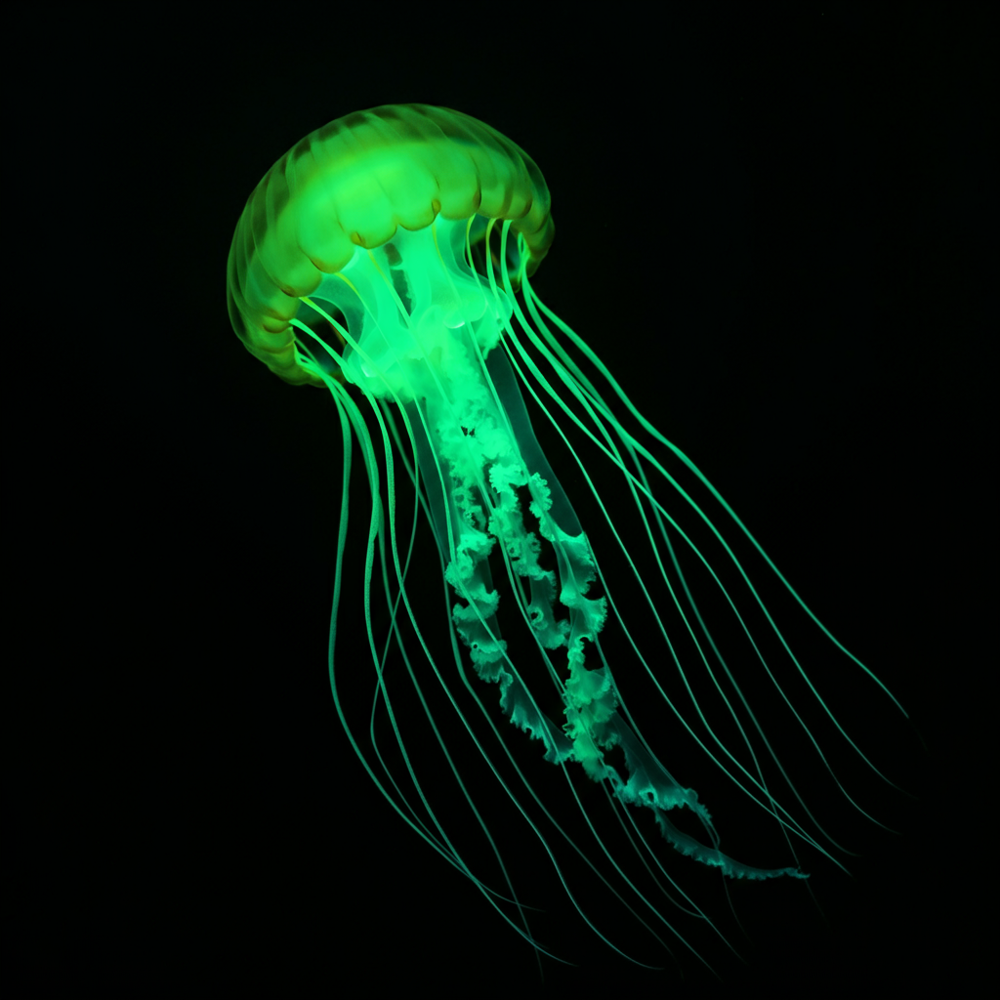

CPU times: user 287 ms, sys: 12.7 ms, total: 300 ms
Wall time: 9.28 s


In [ ]:
%%time

image_prompt = "Green neon sign jellyfish photography"

response = imagen_model.generate_images(
    prompt=image_prompt,
)

response.images[0].show()

### Imagen 3 vs Imagen 3 Fast Models

Both versions can generate high-resolution images,
but the Fast version is slightly faster compared to the standard model.

According to the official description, the following differences exist:

- **Imagen 3**: Generates high-quality images with natural lighting and increased photorealism.

- **Imagen 3 Fast**: Suitable for creating brighter images with higher contrast. Overall, you can see a `40%` decrease in latency in Imagen 3 Fast compared to Imagen 2.

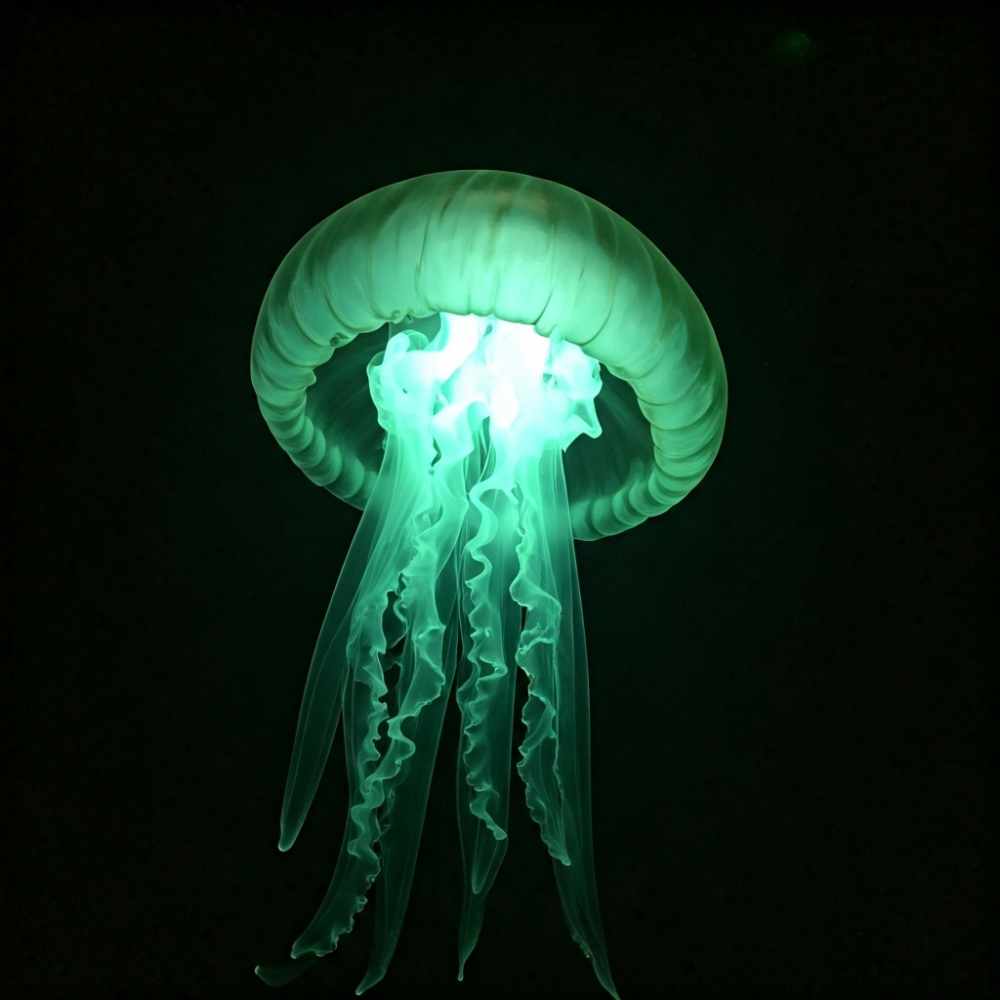

CPU times: user 352 ms, sys: 4.05 ms, total: 356 ms
Wall time: 4.42 s


In [ ]:
%%time

image_prompt = "Green neon sign jellyfish photography"

response = fast_imagen_model.generate_images(
    prompt=image_prompt,
)

response.images[0].show()

## Imagen3 with Aspect Ratio Options

With Imagen 3, you can set the desired image size using the aspect_ratio option. The available values are as follows.

* 1:1
* 9:16
* 16:9
* 3:4
* 4:3

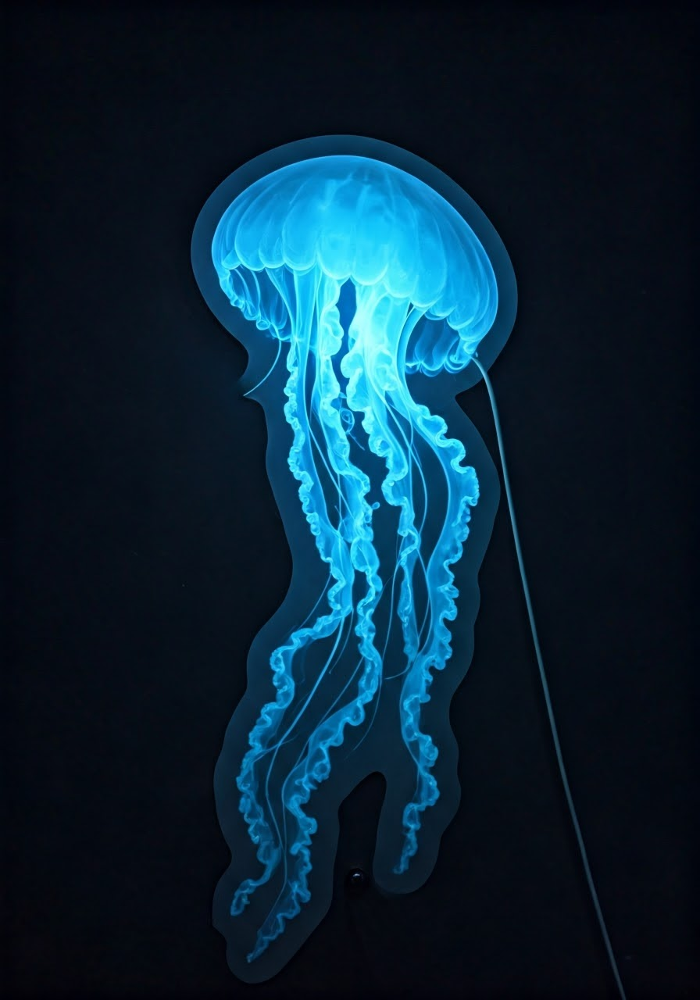

CPU times: user 359 ms, sys: 6.03 ms, total: 365 ms
Wall time: 3.55 s


In [ ]:
%%time

image_prompt = "Blue neon sign jellyfish photography"

response = fast_imagen_model.generate_images(
    prompt=image_prompt,
    aspect_ratio="3:4",
)

response.images[0].show()

## 複数画像の生成

`generate_images()` 関数において、`number_of_images` オプションを指定することで、生成したい画像の枚数を設定できます。

現在、指定可能な値は `1` から `4` の範囲です。


**公開されたサンプルでは8までとなっておりますがAPIドキュメントでは最大4枚**

[API Document](https://cloud.google.com/vertex-ai/generative-ai/docs/model-reference/imagen-api?hl=ja)


In [ ]:
import math
import matplotlib.pyplot as plt

def display_images_in_grid(images: list[GeneratedImage], num_max_cols: int = 4):
    nrows = math.ceil(len(images) / num_max_cols)
    ncols = min(len(images), num_max_cols)

    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(12, 6))

    for i, ax in enumerate(axes.flat):
        if i < len(images):
            ax.imshow(images[i]._pil_image)
            ax.set_aspect("equal")
            ax.set_xticks([])
            ax.set_yticks([])
        else:
            ax.axis("off")

    plt.tight_layout()
    plt.show()

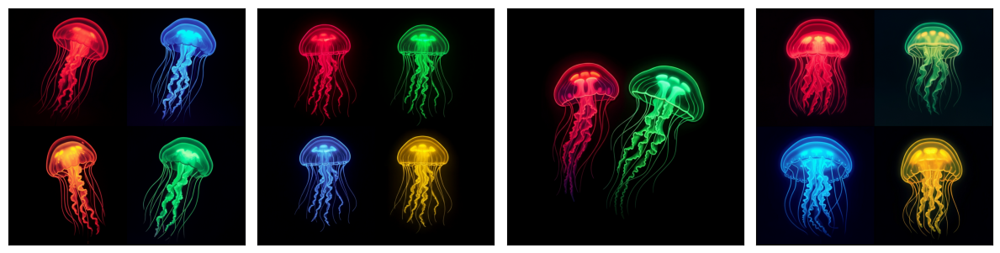

In [ ]:
image_prompt = "4 color neon sign jellyfishs, photography, color: Red, Blue, Green and Yellow"

response = imagen_model.generate_images(
    prompt=image_prompt,
    number_of_images=4,
)

display_images_in_grid(response.images)

## ショーケース：Imagen 3 の主な特徴

Imagen 3は、最近登場した他のモデルと比べて、特に以下の点で優れた性能を発揮しています。

1. **高品質な画像生成**

   Imagen 3は、非常に高品質で鮮明かつ細部まで精緻な画像を生成する能力に優れています。高度なAIアルゴリズムにより、プロンプトに忠実で視覚的に魅力的な画像を作成します。

2. **リアリズムと創造性の両立**

   このモデルは、リアルな描写と創造的な表現のバランスを取るように設計されており、写実的なレンダリングからアート的な作品まで、多様な用途に対応可能です。

3. **多言語対応モデル**

   Imagen 3は多言語に対応しており、さまざまな言語でのプロンプト入力に対して、正確で高品質な画像を生成できます。この機能により、言語の壁を越えて世界中のユーザーが視覚表現を楽しめるようになります。


## セクション1：高品質な画像生成

### 補足

Imagen 3は、他のモデルと比較して、写実的な表現において非常に優れています。質感において過度なコントラストやグラデーション操作を用いることなく、細部まで精緻に描写することが可能です。

一方で、想像的・フィクション的な表現が求められる場面も存在します。そのような場合には、コントラストの強調やハイライトの追加といった演出手法にも対応しており、より印象的な描写を実現できます。

このように、常に一貫したデザイン表現による視覚的な疲労を軽減し、使用者にとって快適な体験を提供します。


In [ ]:
%%time
# @title デフォルトのタイトル テキスト
image_prompt = "Shibuya street in Tokyo with a Hachiko(Akita Inu) statue. Realistic, photographic" # @param {"type":"string"}
### Section 1: High-Quality Image Generation


#image_prompt = "Shibuya street in Tokyo with a Hachiko(Akita Inu) statue. Realistic, photographic"

response = imagen_model.generate_images(
    prompt=image_prompt,
)

response.images[0].show()

Output hidden; open in https://colab.research.google.com to view.

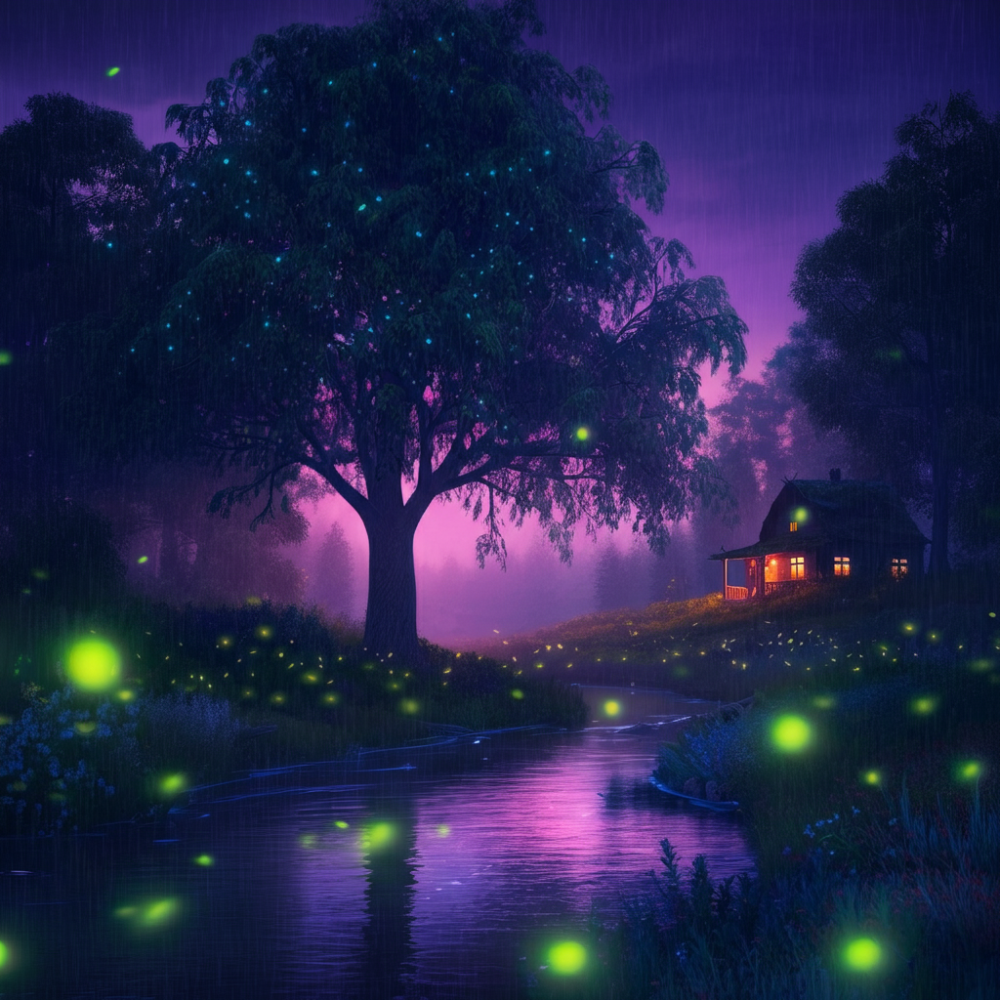

CPU times: user 780 ms, sys: 7.95 ms, total: 788 ms
Wall time: 11.1 s


In [ ]:
### Section 1: High-Quality Image Generation

%%time

image_prompt = "A tranquil stream with a towering ash tree on the opposite bank, harmonized with a natural house nestled among trees. Moonlight filters through, casting a serene purple evening glow. Peaceful, Realistic, Fantasy atmosphere with numerous blue fireflies glowing brightly. A gentle rain falls, adding warmth and comfort to the scene."

response = imagen_model.generate_images(
    prompt=image_prompt,
)

response.images[0].show()

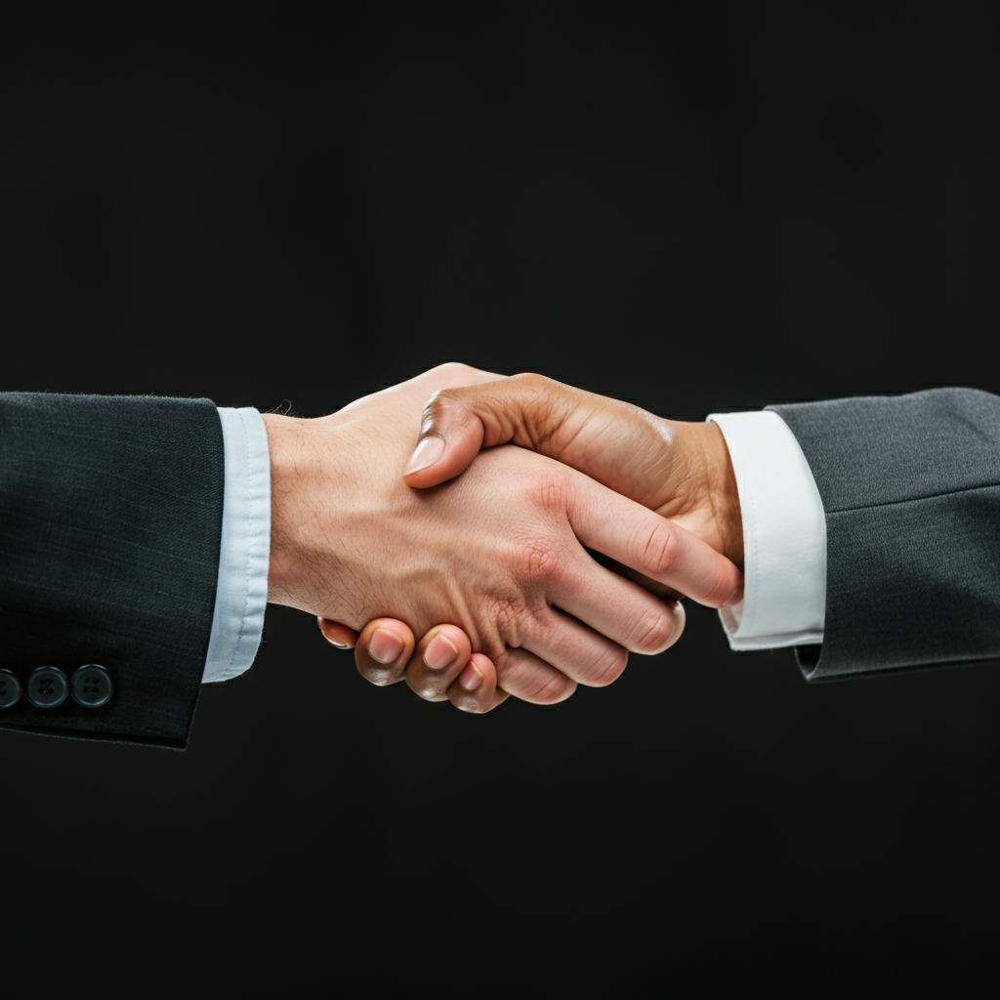

CPU times: user 735 ms, sys: 14.4 ms, total: 749 ms
Wall time: 12.3 s


In [ ]:
### Section 1: High-Quality Image Generation

%%time

image_prompt = "2 people shaking hands, close up of hands."

response = imagen_model.generate_images(
    prompt=image_prompt,
)

response.images[0].show()

## セクション2：リアリズムと創造性

### 補足

Imagen 3は、現実世界の記号や表現を参照しながら、想像力を駆使して動作や状況を補完します。対象物やシチュエーションを実際の環境でどのように見えるかを考慮しながら描写することで、抑制された文脈重視の表現を可能にし、非常にリアルな描写を実現します。

この特性により、Imagen 3が生成する画像は、現実に極めて近い印象を与えます。


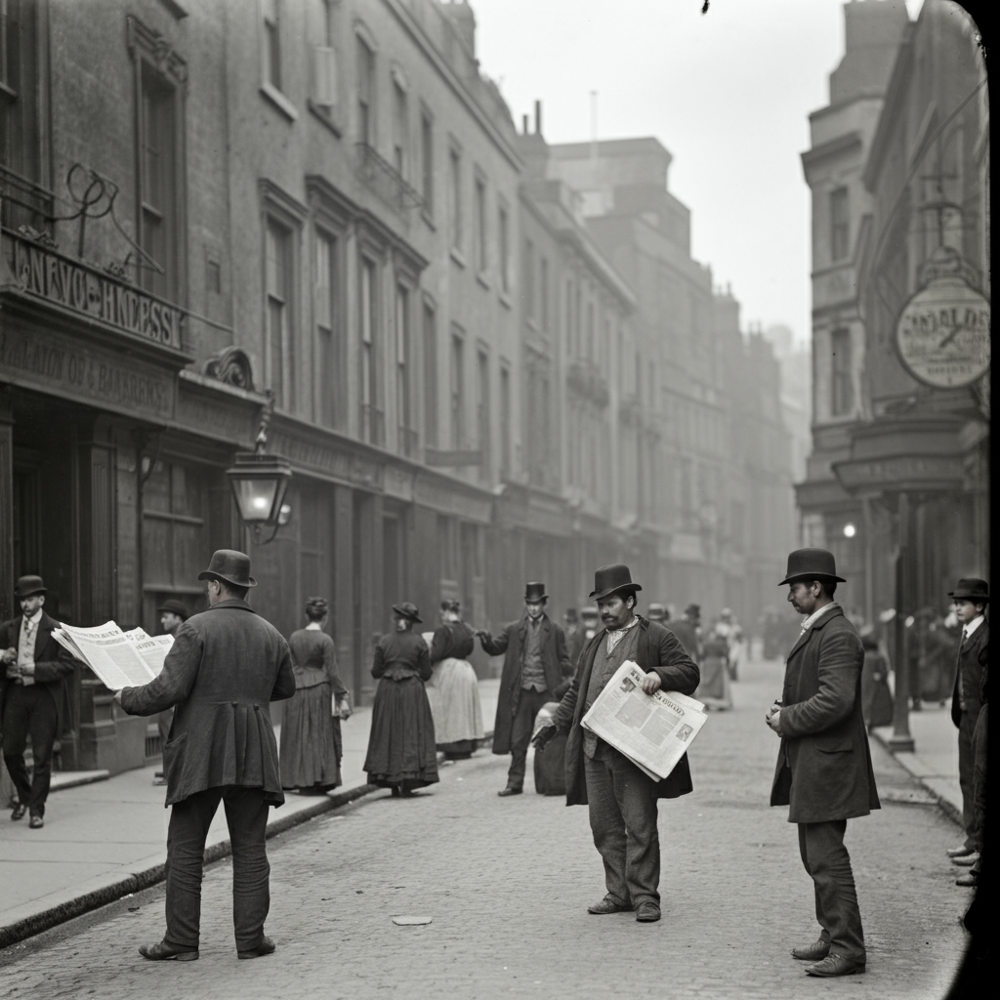

CPU times: user 797 ms, sys: 11.7 ms, total: 809 ms
Wall time: 11.3 s


In [ ]:
### Section 2: Realism and Creativity

%%time

image_prompt = "19th century London street scene, photorealistic, photography, The public and the people handing out newspapers"

response = imagen_model.generate_images(
    prompt=image_prompt,
)

response.images[0].show()

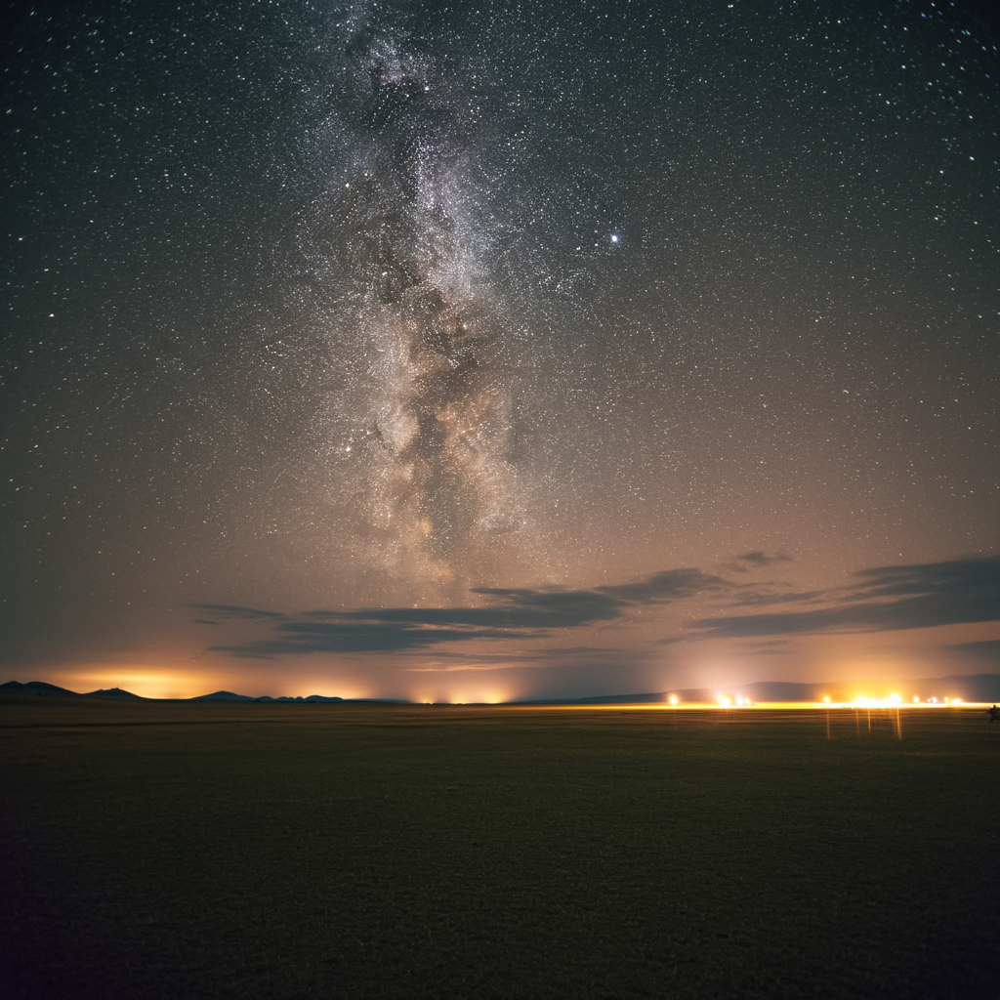

CPU times: user 748 ms, sys: 11.1 ms, total: 759 ms
Wall time: 11.1 s


In [ ]:
### Section 2: Realism and Creativity

%%time

image_prompt = "A vast plain under a sky filled with countless stars, located in Mongolia."

response = imagen_model.generate_images(
    prompt=image_prompt,
)

response.images[0].show()

## セクション3：多言語対応モデル

### 補足

Imagen 3は、最大480トークンまでの多言語プロンプトに対応しており、言語が異なっていても高解像度なビジュアルを安定して生成します。

対応している入力テキストプロンプトの言語は以下のとおりです：

- 英語（`en`、デフォルト）
- 中国語（簡体字）（`zh` / `zh-CN`）
- 中国語（繁体字）（`zh-TW`）
- ヒンディー語（`hi`）
- 日本語（`ja`）
- 韓国語（`ko`）
- ポルトガル語（`pt`）
- スペイン語（`es`）

この多言語対応により、言語の壁を越えた画像生成が可能となり、グローバルなユーザーにとっての利便性が大幅に向上します。

---

- English (`en`, default value)
- Chinese (simplified) (`zh/zh-CN`)
- Chinese (traditional) (`zh-TW`)
- Hindi (`hi`)
- Japanese (`ja`)
- Korean (`ko`)
- Portuguese (`pt`)
- Spanish (`es`)

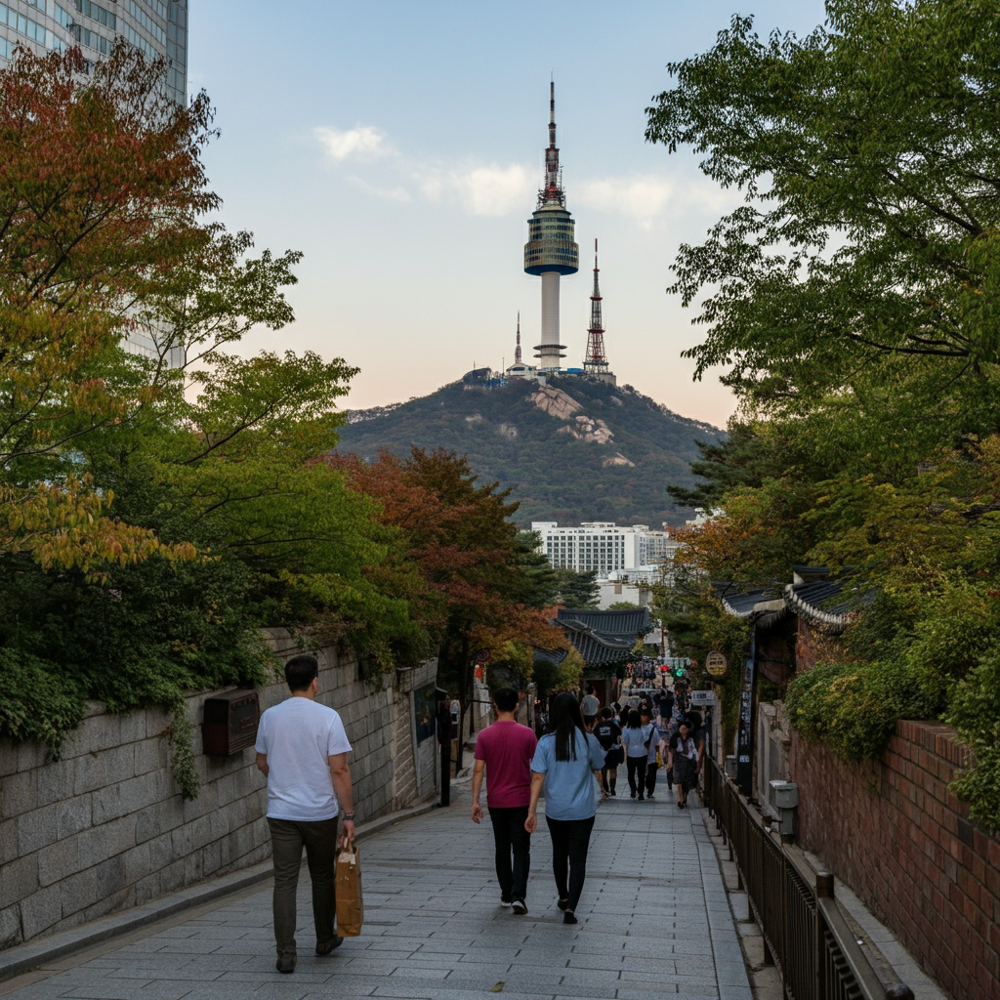

CPU times: user 696 ms, sys: 13.7 ms, total: 710 ms
Wall time: 10.7 s


In [ ]:
### Section 3: Multilingual Model

%%time

image_prompt = "N 서울 타워의 거리 풍경, 타워는 산의 꼭대기에 있는 배경으로 배치. 거리를 거니는 대중들."

response = imagen_model.generate_images(
    prompt=image_prompt,
    language="ko",
)

response.images[0].show()

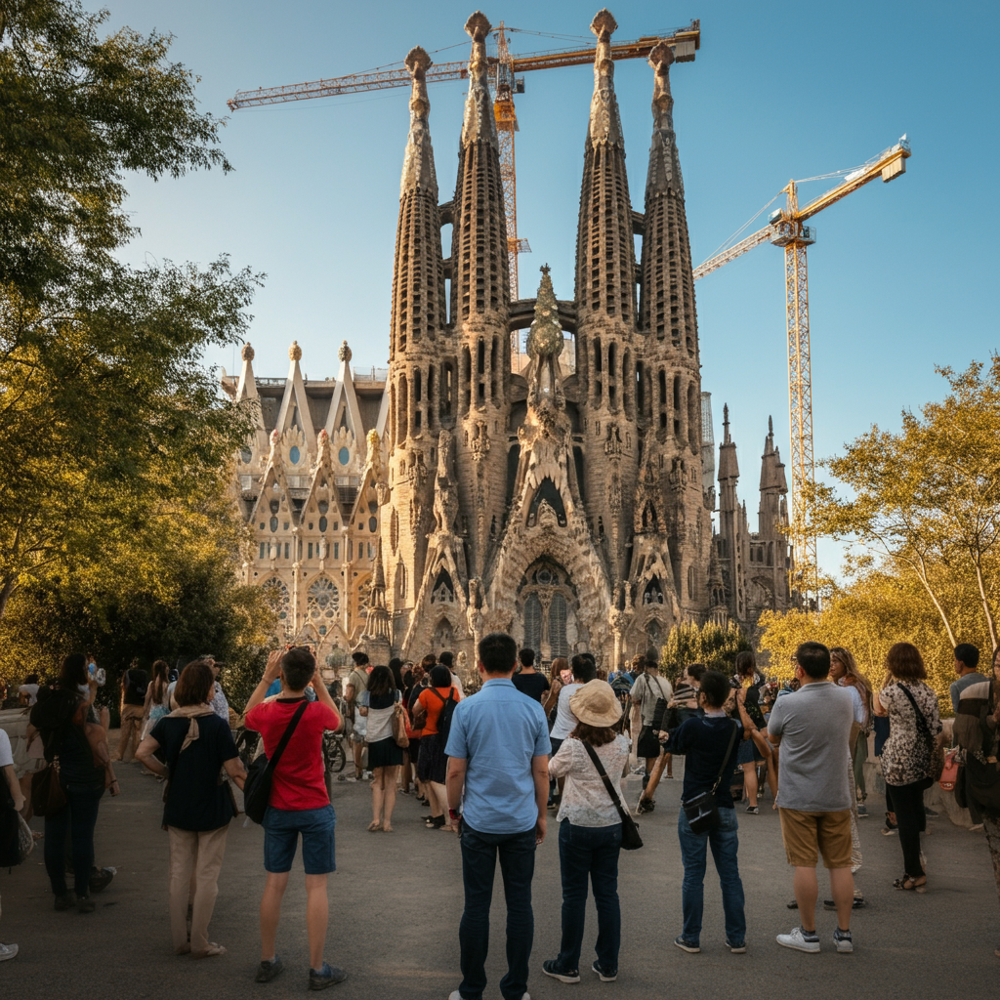

CPU times: user 627 ms, sys: 7.93 ms, total: 635 ms
Wall time: 10.8 s


In [ ]:
### Section 3: Multilingual Model

%%time

image_prompt = "Cerca de la Sagrada Familia, una multitud de turistas están tomando fotos."

response = imagen_model.generate_images(
    prompt=image_prompt,
    language="es",
)

response.images[0].show()